<a href="https://colab.research.google.com/github/exponentialR/DeepLearningFundamentals/blob/main/Non_Linear_LSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#MODERN RNN UNITS 


In [28]:
import tensorflow as tf

In [29]:
from tensorflow.keras.layers import Input, SimpleRNN, GRU, LSTM, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD, Adam

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [30]:
#Make the original data 
series = np.sin((0.1*np.arange(400))**2)

This is actually a time series of the form: 

x(t) = sin(wt**2)

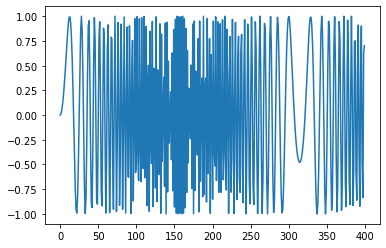

In [31]:
#plot it 
plt.plot(series)
plt.show()

In [32]:
#Build the Supervise Learning Datasets 


T = 10
D = 1 
X = []
Y = []

for t in range (len(series)-T):
  x = series [t:t+T]
  X.append(x)
  y = series [t+T]
  Y.append(y)

X = np.array (X).reshape(-1, T) #make it Nx T 
Y = np.array(Y)
N = len(X)
print ("X.shape", X.shape, "Y.shape", Y.shape)

X.shape (390, 10) Y.shape (390,)


In [33]:
#try the autoregressive linear model 

i = Input(shape = (T,))
x = Dense(1)(i)
model = Model(i, x )
model.compile (
    loss = 'mse', 
    optimizer= Adam(lr=0.01),
)

#train the RNN

r = model.fit(
    X[:-N//2], Y [:-N//2], 
    epochs = 80, 
    validation_data = (X[-N//2:], Y[-N//2:])
)

Epoch 1/80
7/7 [==============================] - 0s 14ms/step - loss: 1.2897 - val_loss: 0.9618
Epoch 2/80
7/7 [==============================] - 0s 4ms/step - loss: 1.0748 - val_loss: 0.8783
Epoch 3/80
7/7 [==============================] - 0s 4ms/step - loss: 0.9363 - val_loss: 0.8249
Epoch 4/80
7/7 [==============================] - 0s 4ms/step - loss: 0.8176 - val_loss: 0.7753
Epoch 5/80
7/7 [==============================] - 0s 4ms/step - loss: 0.7343 - val_loss: 0.7346
Epoch 6/80
7/7 [==============================] - 0s 4ms/step - loss: 0.6729 - val_loss: 0.7096
Epoch 7/80
7/7 [==============================] - 0s 4ms/step - loss: 0.6256 - val_loss: 0.6878
Epoch 8/80
7/7 [==============================] - 0s 4ms/step - loss: 0.5931 - val_loss: 0.6762
Epoch 9/80
7/7 [==============================] - 0s 4ms/step - loss: 0.5674 - val_loss: 0.6671
Epoch 10/80
7/7 [==============================] - 0s 4ms/step - loss: 0.5495 - val_loss: 0.6534
Epoch 11/80
7/7 [=====================

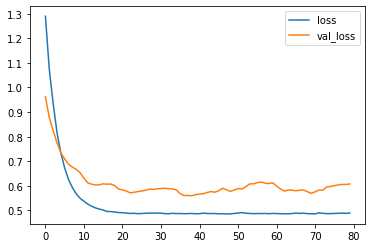

In [34]:
#plot the loss per iteration 
plt.plot(r.history['loss'], label ='loss')
plt.plot(r.history['val_loss'], label = 'val_loss')
plt.legend()

(390, 1)


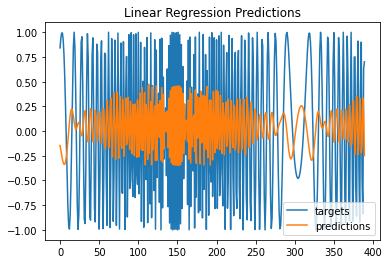

In [35]:
#Do a one step forecast using true targers 
outputs = model.predict(X)
print(outputs.shape)
predictions = outputs[:, 0]

plt.plot(Y, label = 'targets')
plt.plot(predictions, label = 'predictions')
plt.title("Linear Regression Predictions")
plt.legend()
plt.show()


The forecast did very bad!

This means a multi-step forecast will do very bad. 

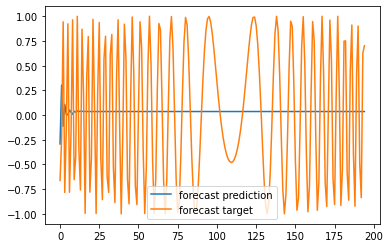

In [36]:
#Multi-step forecast

validation_target = Y [-N//2:]
validation_predictions = []

#train the input

last_x = X [-N//2]

while len(validation_predictions)< len(validation_target):
  p = model.predict (last_x.reshape(1, -1))[0,0]

  #update the predictions list 
  validation_predictions.append(p)

  #make the new input 
  last_x = np.roll(last_x, -1)
  last_x[-1] = p

plt.plot(validation_predictions, label = 'forecast prediction')
plt.plot(validation_target, label = 'forecast target')
plt.legend()

As mentioned earlier, way worst predictions!

Now let us try the RNN model, this time, the shape of the input will change from 2D to 3D

In [48]:
X = X.reshape (-1, T, 1) # this is making it an N x T x D

#build the RNN
i = Input (shape = (T, D))
x = LSTM(10)(i)
x = Dense(1)(x)
model= Model(i, x)
model.compile(
    loss = 'mse', 
    optimizer = Adam(lr = 0.05),
)

#Train the RNN
r = model.fit(
    X[:-N//2], Y[:-N//2],
    batch_size = 32,
    epochs=200,
    validation_data=(X[-N//2:], Y[-N//2:]),
)

Epoch 1/200
7/7 [==============================] - 0s 58ms/step - loss: 0.5338 - val_loss: 0.5378
Epoch 2/200
7/7 [==============================] - 0s 7ms/step - loss: 0.5030 - val_loss: 0.6057
Epoch 3/200
7/7 [==============================] - 0s 7ms/step - loss: 0.5011 - val_loss: 0.5517
Epoch 4/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4721 - val_loss: 0.5137
Epoch 5/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4020 - val_loss: 0.4548
Epoch 6/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2801 - val_loss: 0.2593
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2427 - val_loss: 0.3918
Epoch 8/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1680 - val_loss: 0.1826
Epoch 9/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1183 - val_loss: 0.1698
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0841 - val_loss: 0.1825
Epoch 11/200
7/7 [==========

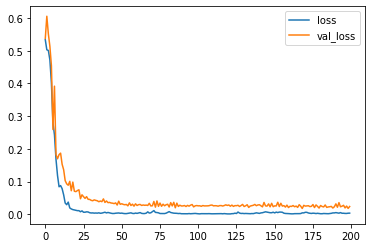

In [49]:
#plot 
plt.plot(r.history['loss'], label='loss')
plt.plot(r.history['val_loss'], label = 'val_loss')
plt.legend()
plt.show()

(390, 1)


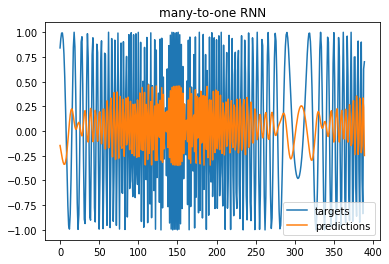

In [50]:
#do the one-step forecast using the true targets 
ouputs = model.predict(X)
print(outputs.shape)
predictions = outputs[:, 0]
plt.plot(Y, label = 'targets')
plt.plot(predictions, label = 'predictions')
plt.title("many-to-one RNN")
plt.legend()
plt.show()

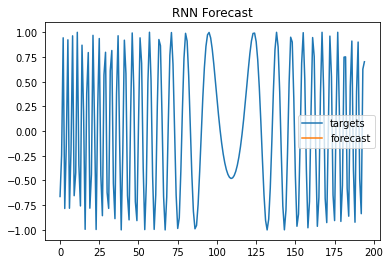

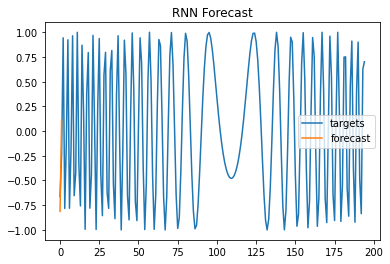

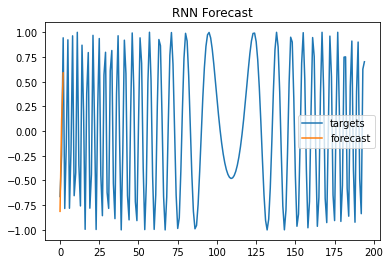

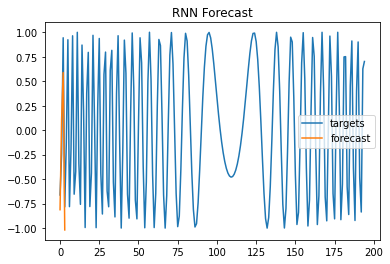

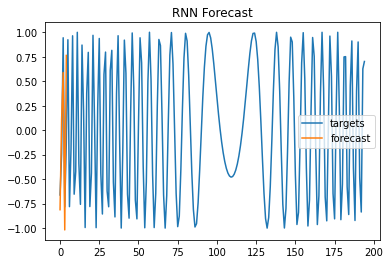

...

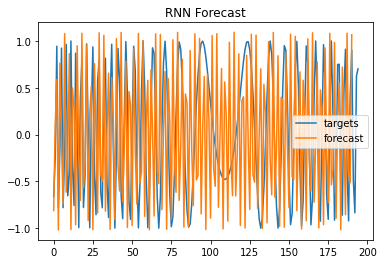

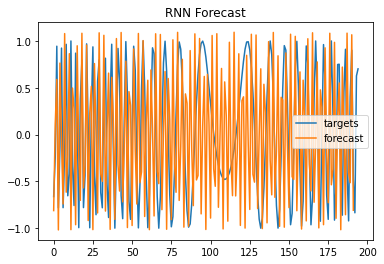

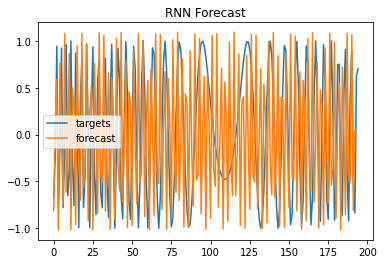

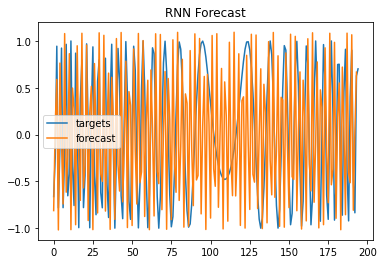

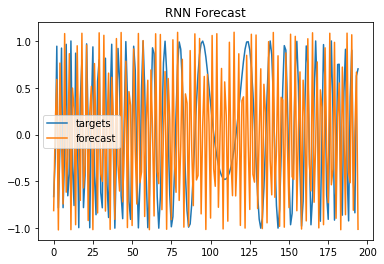

In [51]:
#multistep forecast 
forecast = []
input_ = X[-N//2]
while len(forecast)< len(Y[-N//2:]):
  #Reshape the input to Nx T X D 
  f = model.predict (input_.reshape (1, T, 1))[0,0]
  forecast.append(f)
  
  #lets make the new input the latest forecast

  input_ = np.roll(input_, -1)
  input_[-1] = f 

  plt.plot(Y[-N//2:], label = 'targets')
  plt.plot(forecast, label = 'forecast')
  plt.title("RNN Forecast")
  plt.legend()
  plt.show()


Despite that LSTM are better than RNNs at finding long dependencies, LSTM are not better at everything. LSTM property of finding long time dependencies does not hold true for arbitrary dependencies. There is point even where LSTM forgets, although that point is farther than a simple RNNs but exists nonetheless.

The dataset used in this exercise has no long term dependencies hence, the inability of the LSTM to predict correctly overtime. Hence, there is no advantage to using LSTM to solve this problem.